# **Tutorial 5: Calculating Anomaly - Precipitation**

> Indented block

> Indented block




**Week #, Day #, Name of the day**

**Content creators:** Douglas Rao

**Content reviewers:** TBD

**Content editors:** TBD

**Production editors:** TBD

**Our 2023 Sponsors:** NASA TOPS

# **Tutorial Objectives**

In this tutorial, you will learn how to calculate anomaly using satellite climate data records for climate applications.

By the end of this tutorial you will be able to:

* Calculate the anomaly data against a specific climatology
* Calculate rolling mean of the anomaly data to smooth the time series and extract long-term signals/patterns


# **Setup**



In this section, we have:


1.   **Import cell:** imports all libraries you use in the tutorial.
2.   **Hidden Figure settings cell:** sets up the plotting style (copy exactly)
1.   **Hidden Plotting functions cell:** contains all functions used to create plots throughout the tutorial (so students don't waste time looking at boilerplate matplotlib but can here if they wish to). Please use only matplotlib for plotting for consistency.
2.   **Hidden Helper functions cell:** This should contain functions that students have previously used or that are very simple. Any helper functions that are being used for the first time and are important should be placed directly above the relevant text or exercise (see Section 1.1 for an example).
    



In [ ]:
# Colab installs 

# !pip install s3fs --quiet

# Properly install cartopy in colab to avoid session crash
# !apt-get install libproj-dev proj-data proj-bin --quiet
# !apt-get install libgeos-dev --quiet
# !pip install cython --quiet
# !pip install cartopy --quiet

# !apt-get -qq install python-cartopy python3-cartopy  --quiet
# !pip uninstall -y shapely  --quiet
# !pip install shapely --no-binary shapely  --quiet

In [10]:
# imports 
import s3fs
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs
import boto3
import botocore
import pooch
import holoviews
from geoviews import Dataset as gvDataset
import geoviews.feature as gf
from geoviews import Image as gvImage


In [2]:
# @title Figure settings
import ipywidgets as widgets       # interactive display
%config InlineBackend.figure_format = 'retina'
plt.style.use("https://raw.githubusercontent.com/ClimateMatchAcademy/course-content/main/cma.mplstyle")

#**Section 1: From Climatology to Anomaly**

The above section header should be a description of what the section covers.



In [3]:
# @title Video 1: Video 1 Name
#Tech team will add code to format and display the video

Anomaly describes the departure of the current weather condition away from the normal condition (i.e., climatology) of this time. For example, if the normal January temperature of the city that you live in is 10 °C and the January temperature of this year is 15 °C. We usually say the temperature anomaly of January this year is 5 °C above normal/climatology. 

Now let's calculate the anomaly of monthly precipitation using GPCP CDR data and the skills we learned from last tutorial for calculating climatology.

## **Section 1.1: Calculating Monthly Anomaly**

To calculate anomaly, we first need to calculate the monthly climatology. Since we already learned it during last tutorial, we will fast forward this step. 

In [4]:
# Connect to the AWS S3 bucket for the GPCP Monthly Precipitation CDR data
fs = s3fs.S3FileSystem(anon=True)

# Get the list of all data files in the AWS S3 bucket
file_pattern = 'noaa-cdr-precip-gpcp-monthly-pds/data/*/gpcp_v02r03_monthly_*.nc'
file_location = fs.glob(file_pattern)

# Open connection to all data files
client = boto3.client('s3', config=botocore.client.Config(signature_version=botocore.UNSIGNED)) # initialize aws s3 bucket client
file_ob = [pooch.retrieve('http://s3.amazonaws.com/'+file,known_hash=None ) for file in file_location]

# Open all the monthly data files and concatenate them along the time dimension.
# This process will take ~ 1 minute to complete due to the number of data files.
ds = xr.open_mfdataset(file_ob, combine='nested', concat_dim='time')
ds

<xarray.Dataset>
Dimensions:       (latitude: 72, longitude: 144, time: 530, nv: 2)
Coordinates:
  * latitude      (latitude) float32 -88.75 -86.25 -83.75 ... 83.75 86.25 88.75
  * longitude     (longitude) float32 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
  * time          (time) datetime64[ns] 1979-01-01 1979-02-01 ... 2023-02-01
Dimensions without coordinates: nv
Data variables:
    lat_bounds    (time, latitude, nv) float32 dask.array<chunksize=(1, 72, 2), meta=np.ndarray>
    lon_bounds    (time, longitude, nv) float32 dask.array<chunksize=(1, 144, 2), meta=np.ndarray>
    time_bounds   (time, nv) datetime64[ns] dask.array<chunksize=(1, 2), meta=np.ndarray>
    precip        (time, latitude, longitude) float32 dask.array<chunksize=(1, 72, 144), meta=np.ndarray>
    precip_error  (time, latitude, longitude) float32 dask.array<chunksize=(1, 72, 144), meta=np.ndarray>
Attributes: (12/45)
    Conventions:                CF-1.6, ACDD 1.3
    title:                      Global Precipitation Climatatology Project (G...
    source:                     oc.197901.sg
    references:                 Huffman et al. 1997, http://dx.doi.org/10.117...
    history:                    1) �R
`�, Dr. Jian-Jian Wang, U of Maryland,...
    Metadata_Conventions:       CF-1.6, Unidata Dataset Discovery v1.0, NOAA ...
    ...                         ...
    metadata_link:              gov.noaa.ncdc:C00979
    product_version:            v23rB1
    platform:                   NOAA POES (Polar Orbiting Environmental Satel...
    sensor:                     AVHRR>Advanced Very High Resolution Radiometer
    spatial_resolution:         2.5 degree
    comment:                    Processing computer: eagle2.umd.edu

In [5]:
# Calculate climatology using `.sel()` and `.groupby()` directly.
precip_clim = ds.precip.sel(time=slice('1981-01-01', '2010-12-01')).groupby('time.month').mean(dim='time')
precip_clim

<xarray.DataArray 'precip' (month: 12, latitude: 72, longitude: 144)>
dask.array<transpose, shape=(12, 72, 144), dtype=float32, chunksize=(1, 72, 144), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 -88.75 -86.25 -83.75 ... 83.75 86.25 88.75
  * longitude  (longitude) float32 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
  * month      (month) int64 1 2 3 4 5 6 7 8 9 10 11 12
Attributes:
    long_name:      NOAA Climate Data Record (CDR) of GPCP Monthly Satellite-...
    standard_name:  precipitation amount
    units:          mm/day
    valid_range:    [  0. 100.]
    cell_methods:   area: mean time: mean

Now we have the monthly precipitation climatology. How can we calculate the monthly anomaly?

As we learned before - let's use `.groupby()` from `xarray`. We can split the entire time period based on the month of the year and then subtract the climatology of that specific month from the monthly value and recombine the value together.

In [6]:
# Use `.groupby()` to calculate the monthly climatology
precip_anom = ds.precip.groupby('time.month') - precip_clim
precip_anom

C:\ProgramData\Anaconda3\envs\climatematch_test\lib\site-packages\xarray\core\indexing.py:1440: PerformanceWarning: Slicing with an out-of-order index is generating 45 times more chunks
  return self.array[key]


<xarray.DataArray 'precip' (time: 530, latitude: 72, longitude: 144)>
dask.array<sub, shape=(530, 72, 144), dtype=float32, chunksize=(1, 72, 144), chunktype=numpy.ndarray>
Coordinates:
  * latitude   (latitude) float32 -88.75 -86.25 -83.75 ... 83.75 86.25 88.75
  * longitude  (longitude) float32 1.25 3.75 6.25 8.75 ... 353.8 356.2 358.8
  * time       (time) datetime64[ns] 1979-01-01 1979-02-01 ... 2023-02-01
    month      (time) int64 1 2 3 4 5 6 7 8 9 10 11 ... 4 5 6 7 8 9 10 11 12 1 2

You may have noticed that there is an additional coordinate in the anomaly dataset. The additional coordinate is `month` which is a direct outcome because of the `.groupby()` action we just performed.

If you want to save the data for future use, you can write the data out to a netCDF file using `.to_netcdf()`. It will automatically carry all the coordinates, dimensions, and relevant information into the netCDF file.

In [7]:
# Export the GPCP monthly anomaly data comparing to the climatology period of 1981-2010.
precip_anom.to_netcdf('t5_gpcp-monthly-anomaly_1981-2010.nc')

## **Section 1.2: Examine Anomaly**

First, let's take a look at the geospatial pattern of the monthly anomaly of a selected month – January of 1979.

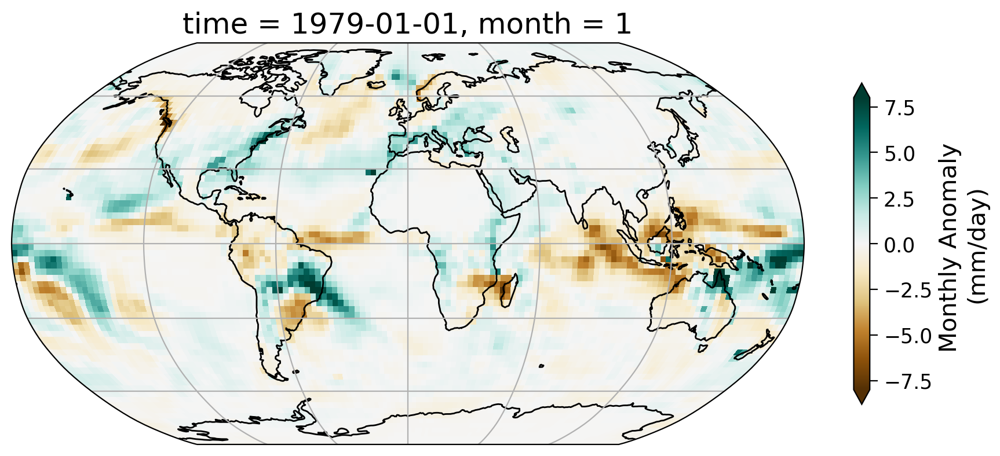

In [8]:
# Initate plot
fig = plt.figure(figsize=(9,6))
# Set map projection
ax = plt.axes(projection=ccrs.Robinson())
# Add coastal lines to indicate land/ocean
ax.coastlines()
# Add grid lines for latitude and longitute
ax.gridlines()
# Add the precipitation data for
precip_anom.sel(time='1979-01-01').plot(ax=ax, transform=ccrs.PlateCarree(),
                                        vmin=-8, vmax=8, cmap='BrBG',
                                        cbar_kwargs=dict(shrink=0.5, label='Monthly Anomaly \n(mm/day)'))

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
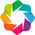

:HoloMap   [time]
   :Overlay
      .Image.I     :Image   [longitude,latitude]   (precip)
      .Coastline.I :Feature   [Longitude,Latitude]

In [20]:
holoviews.extension('bokeh')
dataset_plot = gvDataset(precip_anom.isel(time=slice(0,10))) # only the first 10, as it is a time consuming task 
images = dataset_plot.to(gvImage, ['longitude', 'latitude'], ['precip'], 'time')
images.opts(cmap='BrBG', colorbar=True, width=600, height=400,projection=ccrs.Robinson(),
            clim=(-8,8),clabel ='Monthly Anomaly \n(mm/day)') * gf.coastline


From the map of this monthly anomaly, we can see the spatial pattern of how precipitation for the January of 1979 has departed from the 30-year normal. Part of Amazon saw notable increase of precipitation that month as well as the northeast coast of the United States. 

We can also take a look at the time series of a selected grid. We will use the same point (0°N, 0°E) that we used before as an example to look at the monthly time series of the precipitation anomaly.

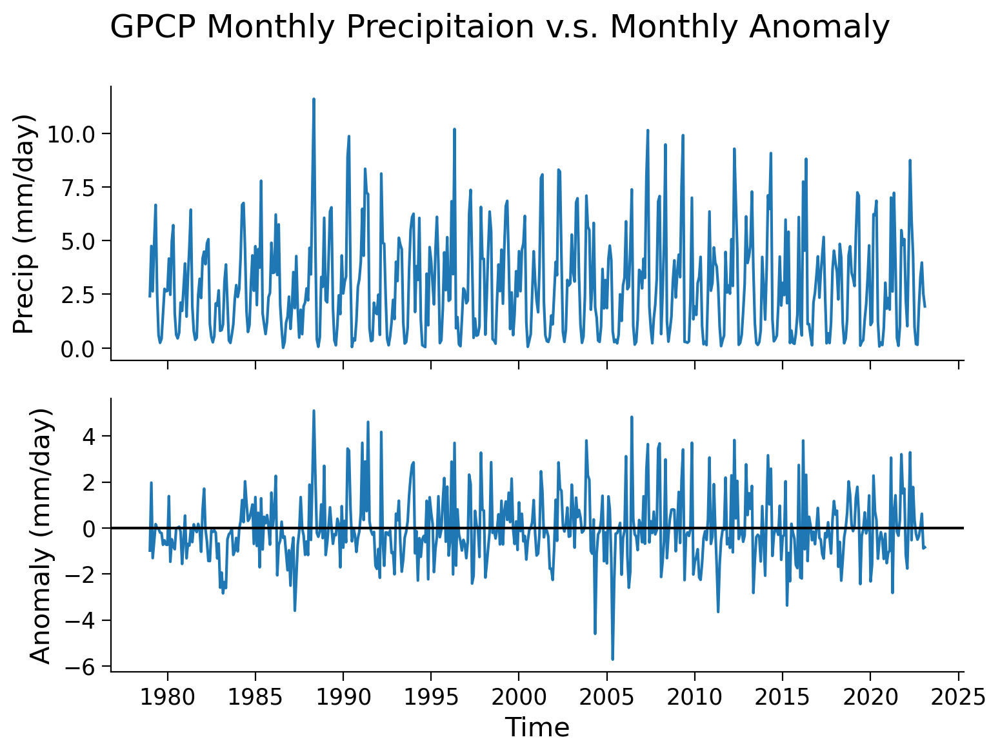

In [21]:
# Set up two subplots that share the x-axis to compare monthly precipitation and
# monthly anomaly
fig, axs = plt.subplots(2, sharex=True)
fig.suptitle('GPCP Monthly Precipitaion v.s. Monthly Anomaly')
axs[0].plot(ds.time, ds.precip.sel(latitude=0, longitude=0, method='nearest'))
axs[0].set_ylabel('Precip (mm/day)')
axs[1].plot(precip_anom.time, precip_anom.sel(latitude=0, longitude=0, method='nearest'))
axs[1].set_ylabel('Anomaly (mm/day)')
axs[1].set_xlabel('Time')
# Add horizontal line of y=0 for the anomaly subplot
axs[1].axhline(y=0, color='k', linestyle='-')

The monthly anomaly time series (lower subplot) does not seem to have obvious seasonal cycle that presented in the monthly precipitation data (upper subplot). This is one of the advantage of using anomaly data for climate analysis - we can remove the repeating pattern caused by seasonality or other stable factors. This will allow us to better focus on the signal in the data that we are interested in, e.g., climate variability or climate trend. 

## **Section 2: Anomaly Analysis**

In this section, we are going to explore a few different analysis on the anamoly data: 

- Calculating rolling mean
- Calculating global mean

## **Section 2.1: Rolling Mean**

Often the monthly anomaly time series will contain noisy data that can hide the pattern caused by large-scale climate variability. We can use rolling mean to smooth the monthly time series data using `.rolling()`.

In [23]:
# Calculate 12-month rolling mean for the selected location
grid_month = precip_anom.sel(latitude=0, longitude=0, method='nearest')
grid_rolling = grid_month.rolling(time=12, center=True).mean()

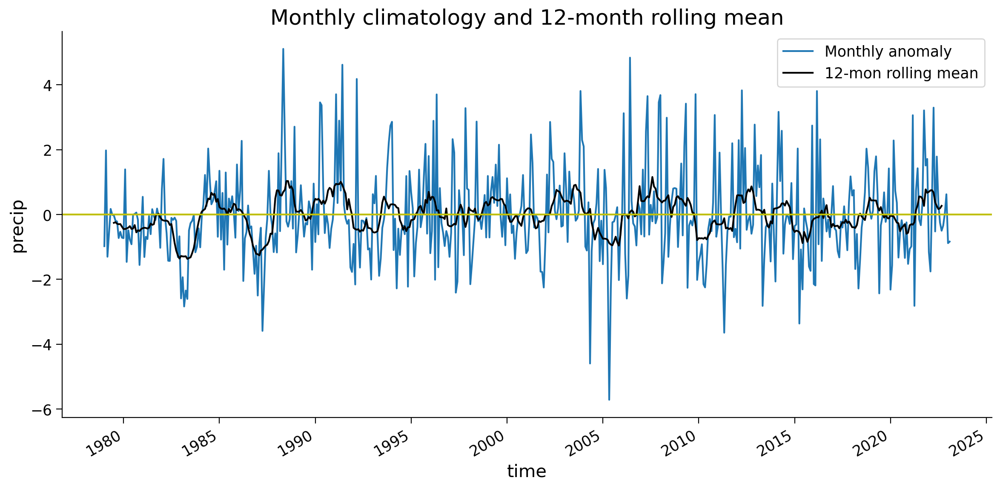

In [30]:
# Create the time series plot of monthly anomaly
fig = plt.figure(figsize=(12,6))
grid_month.plot(label='Monthly anomaly')
grid_rolling.plot(color='k', label='12-mon rolling mean')
plt.axhline(y=0, color='y', linestyle='-')
plt.title('Monthly climatology and 12-month rolling mean')
plt.legend()

As you can see, the 12-month rolling mean removed the high frequency change of monthly precipitation anomaly data while demonstrate the slow-moving change of the precipitation.

### **Exercise 2.1: 24-month rolling mean**

Can you calculate the 24-month rolling mean for the same grid and compare the three different time series (monthly anomaly, 12-month rolling mean, 24-month rolling mean)?

In [31]:
################################################################################
# Exercise: Compare monthly anomaly with 12-month and 24-month rolling mean.   #
################################################################################

# Step 1: Extract the grid time series

# Step 2: Calculate 12-month rolling mean

# Step 3: Calculate 24-month rolling mean

# Step 4: Plot all three time series together with different colors

'''

Please describe the comparison between 12-month and 24-month rolling mean:

'''

'\n\nPlease describe the comparison between 12-month and 24-month rolling mean:\n\n'

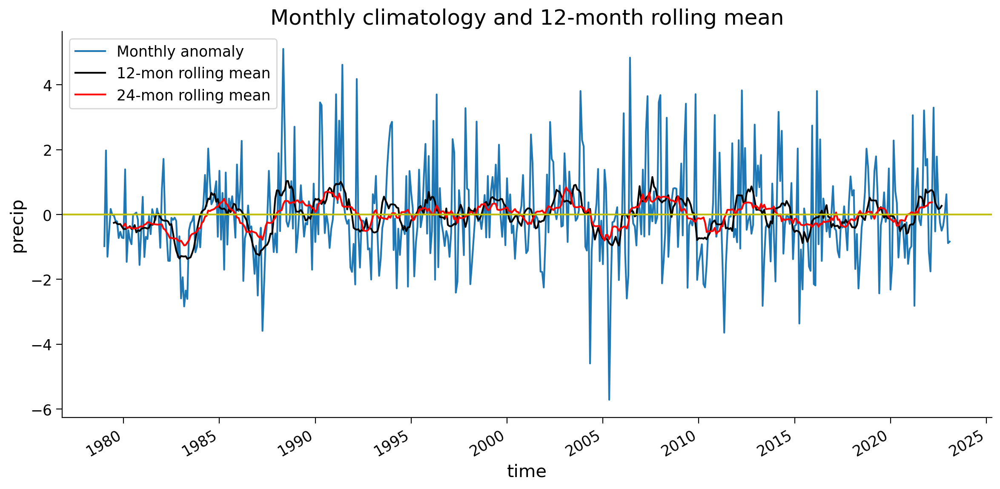

In [33]:
# to remove solution

# Step 1: Extract the grid time series
grid_rolling_24m = grid_month.rolling(time=24, center=True).mean()

# Step 2: Calculate 12-month rolling mean


# Step 3: Calculate 24-month rolling mean


# Step 4: Plot all three time series together with different colors

fig = plt.figure(figsize=(12,6))
grid_month.plot(label='Monthly anomaly')
grid_rolling.plot(color='k', label='12-mon rolling mean')
grid_rolling_24m.plot(color='r', label='24-mon rolling mean')
plt.axhline(y=0, color='y', linestyle='-')
plt.title('Monthly climatology and 12-month rolling mean')
plt.legend()

# ohad comment: the code above already calculated the monthly and 12 monhtly running mean. why would they need to re do them? 
# i've added the solution for the 24 running mean. 


## **Section 2.2: Global Mean**

When you want to understand the change at global scale, global mean values can be aggregated from all grids. Although each grid have same resolution of `2.5°×2.5°`, they represent different areas - the same grid represent larger spatial areas in the tropics than the polar region.

Because of the curvature of the Earth, when we 'slice' the globe based on a fixed bin of latitude, the surface area is getting smaller as we move from the tropics to poles. If we simply calculate the mean value without accounting for this surface area difference, small areas in the high latitudes will have the same impact on the global mean with the large areas in the low latitudes.

So we want to weight the values based on its surface areas, which is often calculated as the cosine of the latitude.

#### Ohad comment: this was already done in previous tutorials. we need to match the text and the code exactly. 

In [34]:
# Calculate the weights using the latitude coordinates
weights = np.cos(np.deg2rad(precip_anom.latitude))
weights.name = "weights"
weights

<xarray.DataArray 'weights' (latitude: 72)>
array([0.02181496, 0.06540319, 0.10886693, 0.15212344, 0.19509035,
       0.23768592, 0.27982906, 0.32143947, 0.36243805, 0.4027467 ,
       0.4422887 , 0.48098874, 0.5187732 , 0.55557024, 0.59130967,
       0.62592345, 0.6593458 , 0.691513  , 0.72236395, 0.7518398 ,
       0.77988446, 0.8064446 , 0.8314696 , 0.85491186, 0.87672675,
       0.89687276, 0.91531146, 0.93200785, 0.9469301 , 0.96004987,
       0.9713421 , 0.98078525, 0.98836154, 0.99405634, 0.99785894,
       0.999762  , 0.999762  , 0.99785894, 0.99405634, 0.98836154,
       0.98078525, 0.9713421 , 0.96004987, 0.9469301 , 0.93200785,
       0.91531146, 0.89687276, 0.87672675, 0.85491186, 0.8314696 ,
       0.8064446 , 0.77988446, 0.7518398 , 0.72236395, 0.691513  ,
       0.6593458 , 0.62592345, 0.59130967, 0.55557024, 0.5187732 ,
       0.48098874, 0.4422887 , 0.4027467 , 0.36243805, 0.32143947,
       0.27982906, 0.23768592, 0.19509035, 0.15212344, 0.10886693,
       0.06540319, 0.02181496], dtype=float32)
Coordinates:
  * latitude  (latitude) float32 -88.75 -86.25 -83.75 ... 83.75 86.25 88.75
Attributes:
    long_name:      Latitude
    standard_name:  latitude
    units:          degrees_north
    valid_range:    [-90.  90.]
    axis:           Y
    bounds:         lat_bounds

In [35]:
# Calculate weighted global monthly mean
anom_weighted = precip_anom.weighted(weights)
global_weighted_mean = anom_weighted.mean(('latitude', 'longitude'))
global_weighted_mean

<xarray.DataArray 'precip' (time: 530)>
dask.array<truediv, shape=(530,), dtype=float32, chunksize=(1,), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) datetime64[ns] 1979-01-01 1979-02-01 ... 2023-02-01
    month    (time) int64 1 2 3 4 5 6 7 8 9 10 11 ... 4 5 6 7 8 9 10 11 12 1 2

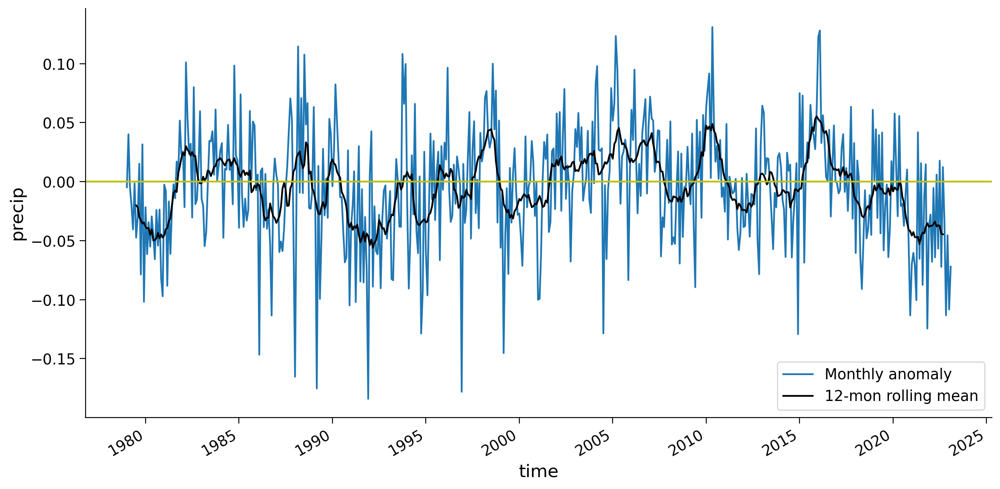

In [36]:
# Create the time series plot of global weighted monthly anomaly
fig = plt.figure(figsize=(12,6))
global_weighted_mean.plot(label='Monthly anomaly')
global_weighted_mean.rolling(time=12, center=True).mean(('latitude', 'longitude')).plot(color='k', label='12-mon rolling mean')
plt.axhline(y=0, color='y', linestyle='-')
plt.legend()

### **Exercise 2.2: Weighted mean or unweighted global mean?**

We calculated the weighted global mean earlier. Now, you can try to explore the difference between the global weighted and unweighted mean time series. 

#### ohad comment: suggetion - add a question about the difference and what it means. 


In [ ]:
################################################################################
# Exercise: Compare global weighted and unweighted mean time series.           #
################################################################################

# Step 1: Calculate unweighted global mean

# Step 2: Calculate different between weighted and unweighted global mean

# Step 3: Plot the time serise of the difference

'''

Please describe the difference between weighted and unweighted global mean:

'''

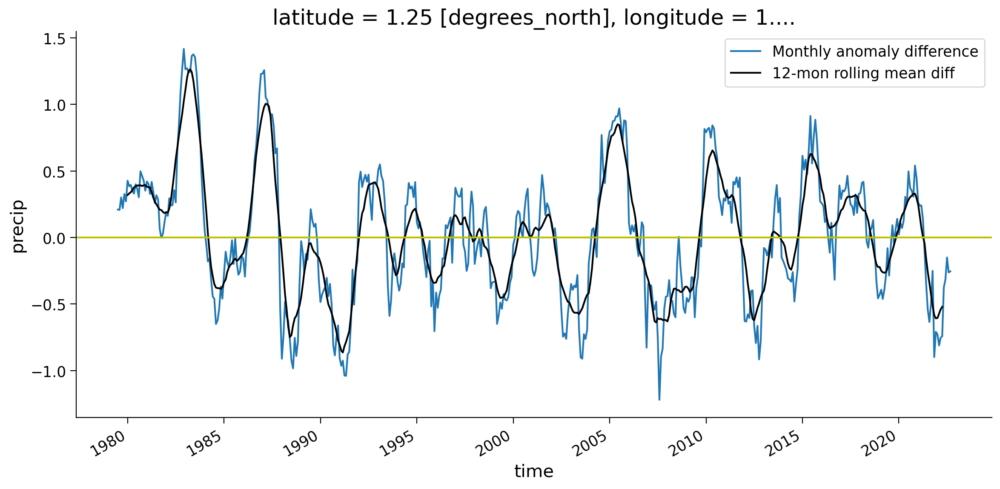

In [37]:
# to remove solution

global_diff=global_weighted_mean-grid_rolling
fig = plt.figure(figsize=(12,6))
global_diff.plot(label='Monthly anomaly difference')
global_diff.rolling(time=12, center=True).mean(('latitude', 'longitude')).plot(color='k', label='12-mon rolling mean diff')
plt.axhline(y=0, color='y', linestyle='-')
plt.legend()

# ohad comment: the unweighted global mean was already calucalted in section 2.1. only thing left here is to plot the difference

# **Summary**

In this tutorial, we learned how to calculate anomaly comparing to a climatology time period. This is the basis for climate monitoring and many climate applications.

* Anomaly allows us to look at the signals that may be covered by the seasonal cycle pattern (e.g., temperature/precipitation seasonal cycle).
* Anomaly data can be further smoothed using rolling mean to reveal longer-term signals at annual or decade time scale.

We will use the anomaly concept to study climate variability in the next tutorial.
